# Исследование рынка заведений общественного питания Москвы

Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты заказчику, которые в будущем помогут в выборе подходящего места для открытия нового заведения.

1. [Открытие данных](#start)
2. [Предобработка данных](#preprocessing)
   * [Обработка дубликатов](#duplicates)
   * [Обработка пропусков](#null)
3. [Анализ данных](#analysis)
   * [Хороплет](#choropleth)
   * [Все заведения на карте](#clasters)
4. [Открытие кофейни](#cofe)
5. [Презентация](#presentation)

## Шаг 1. Загрузим данные и изучим общую информацию
<a id="start"></a>

In [1]:
# Импортируем библиотеки и загрузим данные
import pandas as pd
import seaborn as sns
import datetime as dt
import matplotlib.pyplot as plt
import numpy as np
import folium
import json
import plotly.express as px
from folium import Map, Choropleth
from folium import Marker, Map
from folium.plugins import MarkerCluster

path = 'C:\\Users\\jmilo\\OneDrive\\Рабочий стол\\Яндекс.Практикум\\Спринт 11\\Проект\\'
data = pd.read_csv(path + 'moscow_places.csv', sep=',')
# Ознакомимся с данными
display(data.head())

data.info()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Вывод:** датафрейм хранит информацию о 8406 заведениях общественного питания Москвы. Столбец с числом мест нужно привести к целочисленному типу. Для удобства можно изменить значения в столбце chain - вместо 0-не сетевое, вместо 1-сетевое. 
Не для всех заведений указано время работы. Также много пропусков в столбцах price, avg_bill, middle_avg_bill, middle_coffee_cup и seats. Скорее всего это связано с тем, что эти данные в основном заполняются пользователями (или извлекаются из их отзывов).

## Шаг 2. Предобработка данных
<a id="preprocessing"></a>

In [2]:
# Приведем столбец seats к типу Int64 
data['seats'].astype('Int64')

0       <NA>
1          4
2         45
3       <NA>
4        148
        ... 
8401      86
8402     150
8403     150
8404     150
8405      12
Name: seats, Length: 8406, dtype: Int64

In [3]:
# значения в столбце chain заменим на более читаемые
data['chain'] = data['chain'].apply(lambda x: 'сетевое' if x == 1 else 'не сетевое')

In [4]:
# Проверим
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,не сетевое,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,не сетевое,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,не сетевое,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,не сетевое,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,сетевое,148.0


### Обработка дубликатов
<a id="duplicates"></a>

In [5]:
# Проверим явные дубликаты
data.duplicated().sum()

0

Явных дубликатов нет.

In [6]:
# Приведем названия заведений к нижнему регистру
data['name'] = data['name'].str.lower()

In [7]:
# Приведем адреса к нижнему регистру
data['address'] = data['address'].str.lower()

In [8]:
# Посчитаем сумму неявных дубликатов по столбцам 'name', 'address'
data.duplicated(subset=['name', 'address']).sum()

4

In [9]:
# Удалим дубликаты
data = data[~data.duplicated(subset=['name', 'address'])]
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   object 
 13  seats              4792 non-null   float64
dtypes: float64(6), object(8)
memory usage: 984.6+ KB


### Обработка пропусков
<a id="null"></a>

In [10]:
# Посмотрим на процентное соотношение пропусков в столбцах
pd.DataFrame(round(data.isna().mean().sort_values(ascending=False)*100,1)).style.background_gradient('coolwarm')

,0
middle_coffee_cup,93.600000
middle_avg_bill,62.500000
price,60.500000
avg_bill,54.600000
seats,43.000000
hours,6.400000
name,0.000000
category,0.000000
address,0.000000
district,0.000000


In [11]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,seats
count,8402.000000,8402.000000,8402.000000,3149.000000,535.000000,4792.000000
mean,55.750080,37.608613,4.230017,958.053668,174.721495,108.361436
std,0.069654,0.098585,0.470320,1009.732845,88.951103,122.841130
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000
25%,55.704950,37.538653,4.100000,375.000000,124.500000,40.000000
50%,55.753401,37.605263,4.300000,750.000000,169.000000,75.000000
75%,55.795017,37.664819,4.400000,1250.000000,225.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1288.000000


Больше всего пропусков в столбцах со средним чеком и средней ценой чашки капучино. Заполнить пропуски средним или медианным значением не получится, т.к. даже в одном и том же округе могут быть заведения разной ценовой категории. Здесь оставим пропуски, т.к. эти данные могут понадобиться нам для дальнейших расчетов.
В остальных столбцах заменим пропуски на "unknown", т.к. нет возможности заполнить пропуски достоверными данными.

In [12]:
# Убираем пропуски в остальных столбцах
data[['price', 'avg_bill', 'hours']] = data[['price', 'avg_bill', 'hours']].fillna('unknown')

In [13]:
# Проверяем
display(data.head())
data.info()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,NaN,NaN,не сетевое,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,не сетевое,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,не сетевое,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,NaN,170.0,не сетевое,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,сетевое,148.0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              8402 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              8402 non-null   object 
 9   avg_bill           8402 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   object 
 13  seats              4792 non-null   float64
dtypes: float64(6), object(8)
memory usage: 984.6+ KB


In [14]:
# Создадим столбец с названиями улиц
data['street'] = data['address'].str.split(', ').str[1]

In [15]:
# Создадим столбец с круглосуточными заведениями (булево значение)
data['is_24/7'] = data['hours'].apply(lambda x: True if x in 'ежедневно, круглосуточно' else False)

In [16]:
# Проверим
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,NaN,NaN,не сетевое,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,не сетевое,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,не сетевое,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,NaN,170.0,не сетевое,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,сетевое,148.0,правобережная улица,False


**ВЫВОД:** выполнили предобработку данных - проверили дубликаты, заменили пропуски в нескольких столбцах на "unknown", в столбцах со средними ценами и количеством мест оставили пропуски, чтобы не исказить анализ при дальнейших вычислениях. Привели данные к нужному типу, добавили дополнительные столбцы.

## Шаг 3. Анализ данных
<a id="analysis"></a>

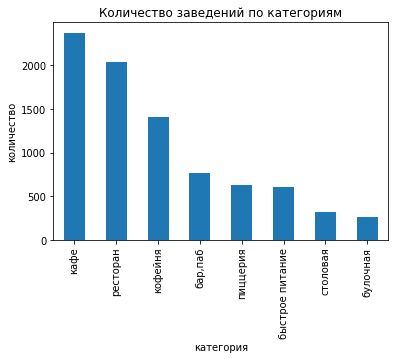

In [17]:
# Посмотрим на распределение объектов по категориям
data['category'].value_counts().sort_values(ascending=False).plot(kind='bar')
plt.title('Количество заведений по категориям')
plt.ylabel('количество')
plt.xlabel('категория');

Больше всего кафе, ресторанов и кофеен. Меньше всего представлено столовых и булочных.

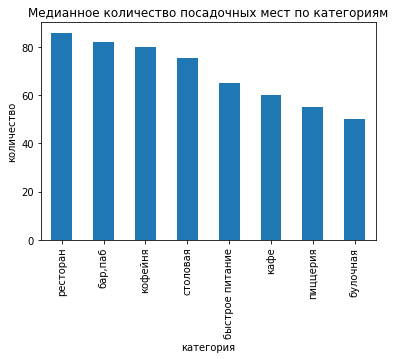

In [18]:
# Исследуйте количество посадочных мест в местах по категориям
data.groupby('category')['seats'].median().sort_values(ascending=False).plot(kind='bar')
plt.title('Медианное количество посадочных мест по категориям')
plt.ylabel('количество')
plt.xlabel('категория');

Самые вместительные заведения - это бар(паб) и ресторан. Меньше всего в булочных.

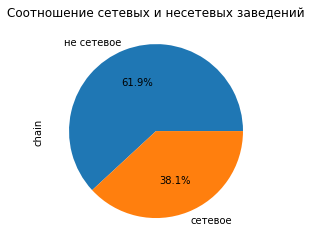

In [19]:
# изобразим соотношение сетевых и несетевых заведений в датасете
data['chain'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Соотношение сетевых и несетевых заведений');

Больше всего не сетевых заведений (61,9%).

In [20]:
# Создадим таблицу с общим количеством заведений в каждой категории
total_category = data.pivot_table(index='category', values='name', aggfunc='count').reset_index()
total_category.columns = ['category', 'total']
total_category

,category,total
0,"бар,паб",764
1,булочная,256
2,быстрое питание,603
3,кафе,2376
4,кофейня,1413
5,пиццерия,633
6,ресторан,2042
7,столовая,315


In [21]:
# Расчитаем процент сетевых заведений от общего числа по категориям
setevoe = data.groupby(['category', 'chain'])['chain'].count()
setevoe.name = 'count'
setevoe = setevoe.reset_index()
setevoe = setevoe.query('chain == "сетевое"')
setevoe = setevoe.merge(total_category, on='category')
setevoe['percent'] = round(setevoe['count'] / setevoe['total'], 2)
setevoe = setevoe.sort_values(by='percent', ascending=False)
setevoe

,category,chain,count,total,percent
1,булочная,сетевое,157,256,0.61
5,пиццерия,сетевое,330,633,0.52
4,кофейня,сетевое,720,1413,0.51
2,быстрое питание,сетевое,232,603,0.38
6,ресторан,сетевое,729,2042,0.36
3,кафе,сетевое,779,2376,0.33
7,столовая,сетевое,88,315,0.28
0,"бар,паб",сетевое,168,764,0.22


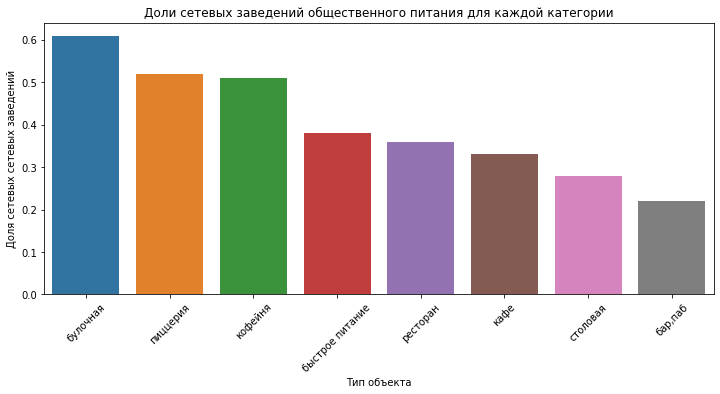

In [22]:
# Построим график доли сетевых заведений
plt.figure(figsize=(12,5))
sns.barplot(x=setevoe['category'], y=setevoe['percent'])
plt.title('Доли сетевых заведений общественного питания для каждой категории')
plt.ylabel('Доля сетевых сетевых заведений')
plt.xlabel('Тип объекта')
plt.xticks(rotation=45);

Доля сетевых булочных самая высокая среди всех категорий. Меньше всего сетевых баров и пабов.

In [23]:
# Сохраним ТОП-15 сетевых заведений в отдельную переменную
top15 = data.query('chain == "сетевое"')
top15 = top15.groupby(['name', 'category'])['district'].count()
top15 = top15.sort_values(ascending = False).reset_index().head(15)
top15.columns = ['name', 'category', 'count']
top15

,name,category,count
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


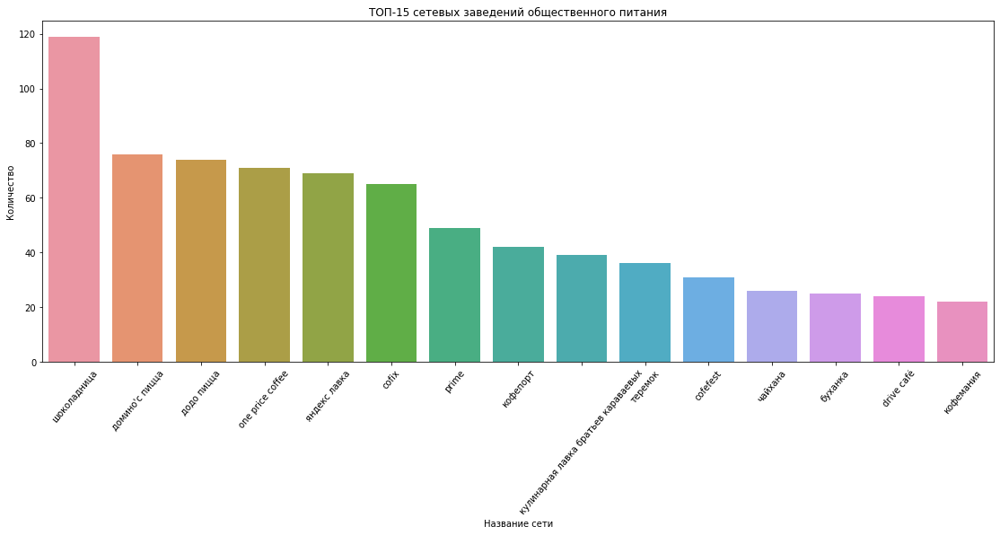

In [24]:
# Построим график ТОП-15 сетевых заведений
plt.figure(figsize=(19,7))
sns.barplot(x=top15['name'], y=top15['count'])
plt.title('ТОП-15 сетевых заведений общественного питания')
plt.ylabel('Количество')
plt.xlabel('Название сети')
plt.xticks(rotation=50);

Самая популярная сеть "Шоколадница".

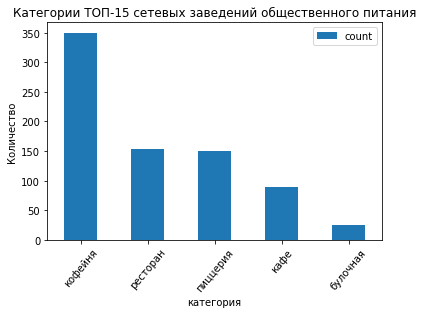

In [25]:
# Построим график ТОП-15 сетевых заведений по категориям
top15.groupby('category').sum().sort_values(by='count', ascending=False).plot(kind='bar')
plt.title('Категории ТОП-15 сетевых заведений общественного питания')
plt.ylabel('Количество')
plt.xlabel('категория')
plt.xticks(rotation=50);

Больше всего ТОП-15 сетевых заведений находятся в категории кофейня.

In [26]:
# Создадим таблицу с общим количеством заведений по округам
total_district = data.pivot_table(index='district', values='name', aggfunc='count').reset_index()
total_district.columns = ['district', 'total']
total_district

,district,total
0,Восточный административный округ,798
1,Западный административный округ,850
2,Северный административный округ,898
3,Северо-Восточный административный округ,890
4,Северо-Западный административный округ,409
5,Центральный административный округ,2242
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Южный административный округ,892


In [27]:
# Расчитаем процент категорий заведений от общего числа по районам
district_df = data.groupby(['district', 'category']).agg({'name' : 'count'})
district_df = district_df.sort_values(by='name', ascending = False).reset_index()
district_df = district_df.rename(columns={'name':'count'})
district_df = district_df.merge(total_district, on='district')
district_df['percent'] = round(district_df['count'] / district_df['total'], 2)
district_df = district_df.sort_values(by='percent', ascending=False)
district_df

,district,category,count,total,percent
8,Юго-Восточный административный округ,кафе,282,714,0.39
16,Восточный административный округ,кафе,272,798,0.34
48,Юго-Западный административный округ,кафе,238,709,0.34
0,Центральный административный округ,ресторан,670,2242,0.30
32,Южный административный округ,кафе,264,892,0.30
...,...,...,...,...,...
31,Северо-Восточный административный округ,булочная,28,890,0.03
71,Северо-Западный административный округ,булочная,12,409,0.03
7,Центральный административный округ,булочная,50,2242,0.02
15,Юго-Восточный административный округ,булочная,13,714,0.02


In [28]:
# Строим график
fig = px.bar(district_df,
             x='percent',
             y='district',
             template='ggplot2',                    
             color='category'
            )

fig.update_layout(title='Доля заведений каждой категории по районам',
                   xaxis_title='Доля заведений',
                   yaxis_title='Название района',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

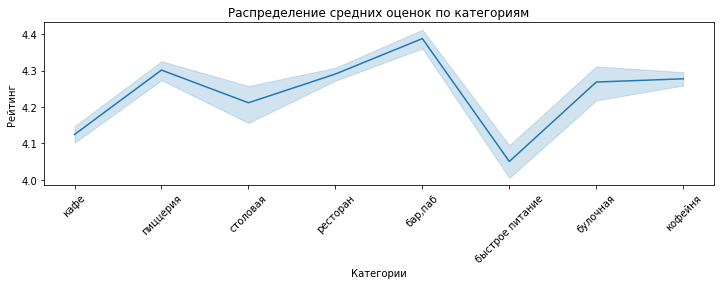

In [29]:
# Посмотрим на средние оценки заведений по категориям
plt.figure(figsize=(12, 3))
ax = sns.lineplot(x="category", y="rating", data=data.sort_values(by='rating'))
plt.title('Распределение средних оценок по категориям')
plt.ylabel('Рейтинг')
plt.xlabel('Категории')
plt.xticks(rotation=45);

Самые высокие оценки имеют бары/пабы, затем идут пиццерии, рестораны и кофейни.

### Хороплет
<a id="choropleth"></a>

In [30]:
# Для каждого округа посчитаем средний рейтинг заведений
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
2,Северный административный округ,4.240980
3,Северо-Восточный административный округ,4.147978
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [31]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

## Отобразим все заведения на карте
<a id="clasters"></a>

In [32]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

In [33]:
# Составим таблицу с ТОП-15 улиц по количеству заведений
top15_street = data.pivot_table(index='street', columns='category', values='name', aggfunc='count')
top15_street['total'] = top15_street.sum(axis=1)
top15_street = top15_street.sort_values(by='total', ascending=False).head(15)
top15_street

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
street,,,,,,,,,
проспект мира,11.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0,183.0
профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122.0
проспект вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0,108.0
ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0,107.0
ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0,95.0
дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88.0
каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0,77.0
варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0,76.0
ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0,70.0


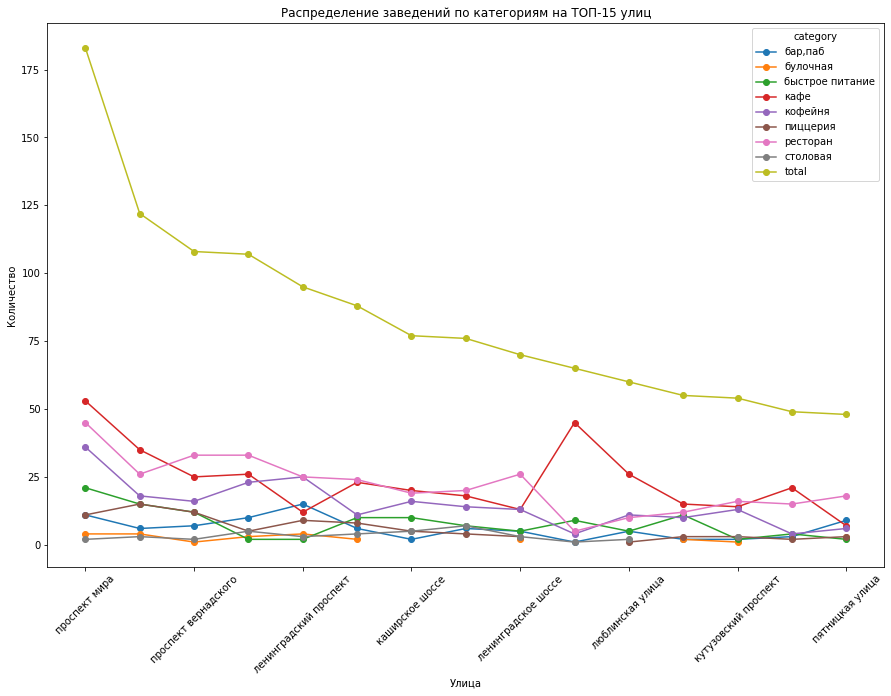

In [34]:
# Построим график
top15_street.plot(figsize=(15,10), style='o-')
plt.title('Распределение заведений по категориям на ТОП-15 улиц')
plt.ylabel('Количество')
plt.xlabel('Улица')
plt.xticks(rotation=45)
plt.show();

Больше всего заведений находится на проспекте Мира. Больше всего на этой улице (и больше, чем на других улицах) кафе, ресторанов и кофеен.

In [35]:
# Посчитаем количество улиц с одним заведением общественного питания
one_object_street = data.pivot_table(index='street', values='name', aggfunc='count').reset_index()
one_object_street = one_object_street.query('name == 1')
print('Улиц с одним заведением', len(one_object_street))

Улиц с одним заведением 457


In [36]:
# Посчитаем медианный средний чек для каждого округа
district_price = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
district_price

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [37]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
folium.Choropleth(
    geo_data=state_geo,
    data=district_price,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Медианный средний чек по районам'
).add_to(m)

# выводим карту
m

**ВЫВОД:** в ходе анализа данных выяснили:
- больше всего заведений в категориях кафе, ресоран и кофейня, меньше всего булочных
- больше всего посадочных мест в барах, ресторанах и кофейнях, меньше всего опять в булочных
- почти 62% заведений являются сетевыми
- больше всего из ТОП-15 сетевых заведений находятся в ЦАО, меньше всего в СЗАО
- больше всего из ТОП-15 сетевых заведений категории кофейня, меньше быстрое питание
- больше всего заведений находится в ЦАО, меньше всего в СЗАО
- в среднем самые высокие рейтинги у заведений из категорий бар, пиццерия, ресторан и кофейня
- на проспекте Мира находится больше заведений общественного питания, чем на любой другой улице Москвы (184)
- На 458 улицах находится по 1 заведению

## Шаг 4. Детализируем исследование: открытие кофейни
<a id="cofe"></a>

In [38]:
# Посчитаем количество кофеен во всем датасете
data.loc[(data['category'] == 'кофейня')]['name'].count()

1413

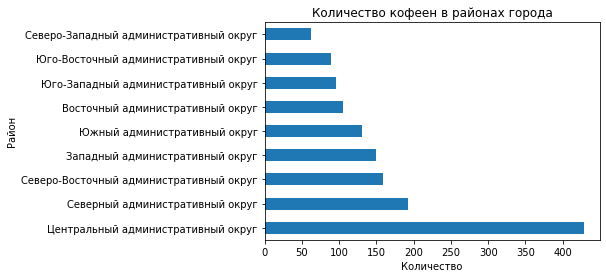

In [39]:
# Посмотрим на распределение кофеен по округам
cofe = data.query('category == "кофейня"')
cofe.groupby('district')['name'].count().sort_values(ascending=False).plot(kind='barh')
plt.title('Количество кофеен в районах города')
plt.xlabel('Количество')
plt.ylabel('Район');

Всего в датасете 1413 кофеен, больше всего в ЦАО, меньше всего СЗАО.

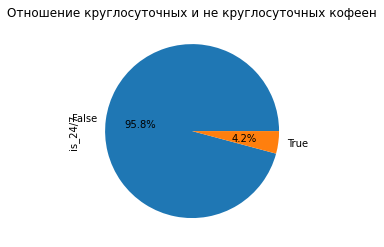

In [40]:
# Посмотрим на режим работы кофеен
cofe['is_24/7'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Отношение круглосуточных и не круглосуточных кофеен');

Практически все (95,8%) кофейни в датасете не круглосуточные.

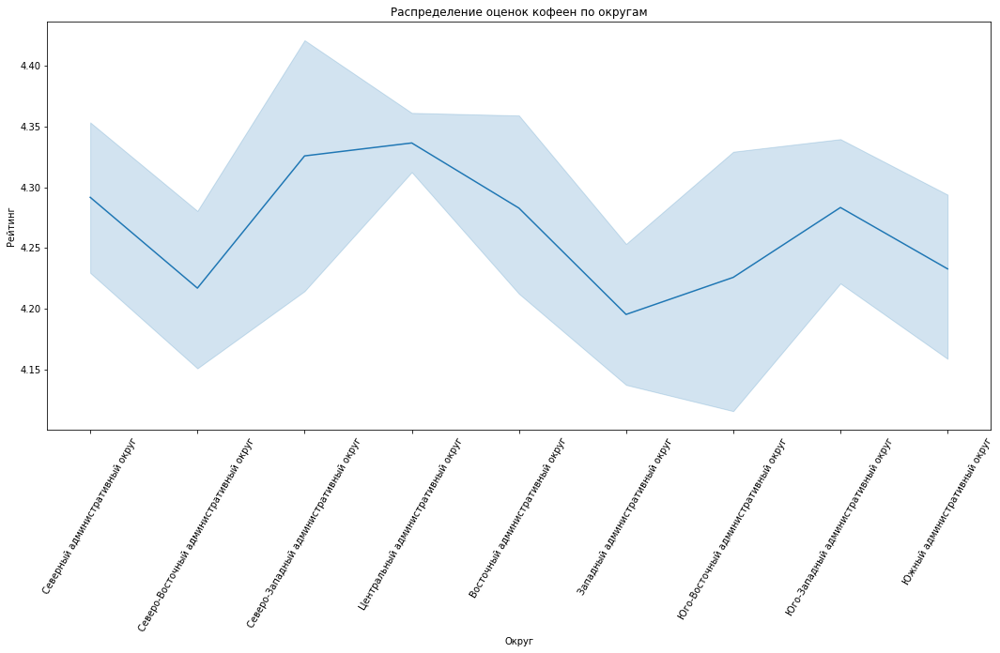

In [41]:
# Посмотрим на средние оценки заведений по категориям
plt.figure(figsize=(18, 8))
ax = sns.lineplot(x="district", y="rating", data=cofe)
plt.title('Распределение оценок кофеен по округам')
plt.ylabel('Рейтинг')
plt.xlabel('Округ')
plt.xticks(rotation=60);

In [42]:
# Для каждого округа посчитаем средний рейтинг кофеен
cofe_df = cofe.groupby('district', as_index=False)['rating'].agg('mean')

In [43]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
folium.Choropleth(
    geo_data=state_geo,
    data=cofe_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен'
).add_to(m)

# выводим карту
m

Одни из самых высоких оценок в СЗАО и ЦАО.

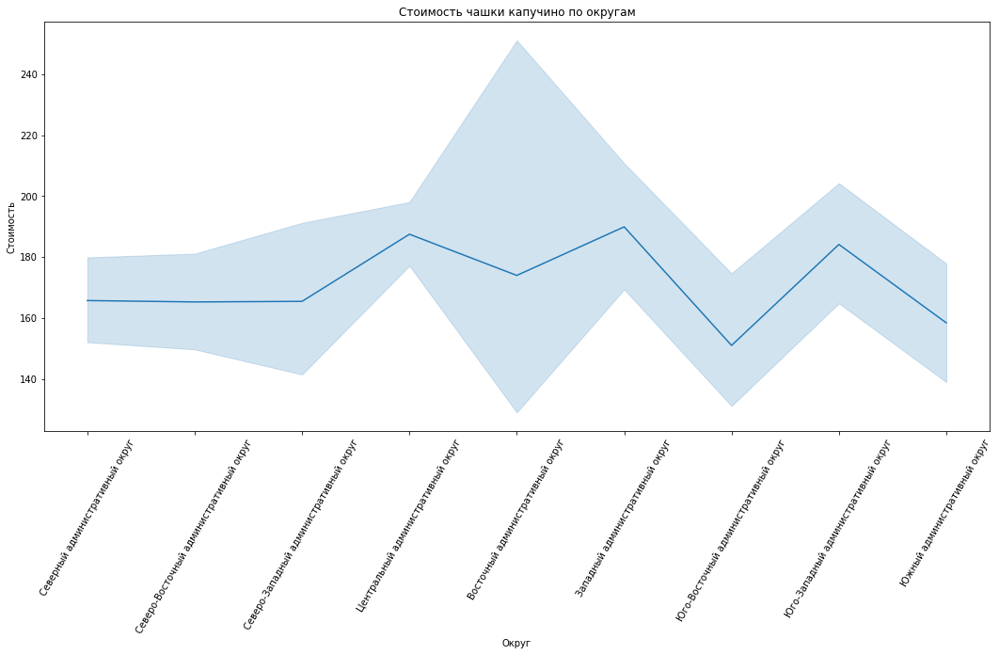

In [44]:
# Посмотрим на среднюю цену чашки капучино по округам
plt.figure(figsize=(18, 8))
ax = sns.lineplot(x="district", y="middle_coffee_cup", data=cofe)
plt.title('Стоимость чашки капучино по округам')
plt.ylabel('Стоимость')
plt.xlabel('Округ')
plt.xticks(rotation=60);

В ВАО самый большой разброс цен на чашку капучино. На графике видны три пика средней цены около 180 рублей. 

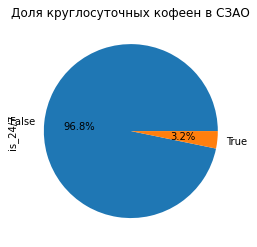

In [45]:
# Посмотрим на долю круглосуточных кофеен в СЗАО
cofe.loc[(cofe['district']=='Северо-Западный административный округ')]['is_24/7'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Доля круглосуточных кофеен в СЗАО');

**ВЫВОД:** исходя из анализа данных о кофейнях Москвы, можно рекомендовать открытие новой не круглосуточной кофейни в Северо-Западном административном округе с ценой чашки капучино 165 руб. В этом районе сильный разброс рейтингов заведений и меньше всего кофеен, при открытии будет не такая сильная конкуренция как в Центральном административном округе. При этом цена чашки капучино в 165 рублей в соразмерима с ценой чашки капучино в центре, но при этом аренда помещения скорее всего будет дешевле, чем в центре. Также, согласно графика, есть потенциал для увеличения цены в будщем.